<a href="https://www.kaggle.com/code/masatomurakawamm/autoeda-automl-pycaret-deeplearning-tf?scriptVersionId=98044242" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

---
# [House Prices - Advanced Regression Techniques][1]

- Goal: It is your job to predict the sales price for each house. For each Id in the test set, you must predict the value of the SalePrice variable. 

---
#### **The aim of this notebook is to**
- **1. Conduct Exploratory Data Analysis (EDA) and Feature Engineering.**
- **2. Use PyCaret for the entire ML pipeline.**
- **3. Create and train a Deep Learning model with TensorFlow.**

---
**References:** Thanks to previous great codes and notebooks.

- [PyCaret Tutoricals][2]
 - [Regression Tutorial - Level Beginner][3]
 - [Regression Tutorial  - Level Intermediate][4]
 
**My Previous Notebooks:**
- [SpaceshipTitanic: EDA + TabTransformer[TensorFlow]][5]

---
### **If you find this notebook useful, please do give me an upvote. It helps me keep up my motivation.**
#### **Also, I would appreciate it if you find any mistakes and help me correct them.**

---
[1]: https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques
[2]: https://pycaret.gitbook.io/docs/get-started/tutorials
[3]: https://github.com/pycaret/pycaret/blob/master/tutorials/Regression%20Tutorial%20Level%20Beginner%20-%20REG101.ipynb
[4]: https://github.com/pycaret/pycaret/blob/master/tutorials/Regression%20Tutorial%20Level%20Intermediate%20-%20REG102.ipynb
[5]: https://www.kaggle.com/code/masatomurakawamm/spaceshiptitanic-eda-tabtransformer-tensorflow

<h1 style="background:#05445E; border:0; border-radius: 12px; color:#D3D3D3"><center>0. TABLE OF CONTENTS</center></h1>

<ul class="list-group" style="list-style-type:none;">
    <li><a href="#1" class="list-group-item list-group-item-action">1. Settings</a></li>
    <li><a href="#2" class="list-group-item list-group-item-action">2. Data Loading</a></li>
    <li><a href="#3" class="list-group-item list-group-item-action">3. EDA and Feature Engineering</a>
        <ul class="list-group" style="list-style-type:none;">
            <li><a href="#3.1" class="list-group-item list-group-item-action">3.1 AutoEDA with Sweetviz</a></li>
            <li><a href="#3.2" class="list-group-item list-group-item-action">3.2 Feature Selection</a></li>
            <li><a href="#3.3" class="list-group-item list-group-item-action">3.3 Target Distribution</a></li>
            <li><a href="#3.4" class="list-group-item list-group-item-action">3.4 Numerical Features</a></li>
            <li><a href="#3.5" class="list-group-item list-group-item-action">3.5 Categorical Feature</a></li>
        </ul>
    </li>
    <li><a href="#4" class="list-group-item list-group-item-action">4. PyCaret</a>
        <ul class="list-group" style="list-style-type:none;">
            <li><a href="#4.1" class="list-group-item list-group-item-action">4.1 Setting up Environment</a></li>
            <li><a href="#4.2" class="list-group-item list-group-item-action">4.2 Create Model</a></li>
            <li><a href="#4.3" class="list-group-item list-group-item-action">4.3 Tune Model</a></li>
            <li><a href="#4.4" class="list-group-item list-group-item-action">4.4 Plot Model</a></li>
            <li><a href="#4.5" class="list-group-item list-group-item-action">4.5 Validate Model on Hold-out Sample</a></li>
            <li><a href="#4.6" class="list-group-item list-group-item-action">4.6 Finalize Model and Inference</a></li>
            <li><a href="#4.7" class="list-group-item list-group-item-action">4.7 Ensemble Models</a></li>
        </ul>
    </li>
    <li><a href="#5" class="list-group-item list-group-item-action">5. Deep Learning</a>
        <ul class="list-group" style="list-style-type:none;">
            <li><a href="#5.1" class="list-group-item list-group-item-action">5.1 Creating Dataset</a></li>
            <li><a href="#5.2" class="list-group-item list-group-item-action">5.2 Preprocessing Model</a></li>
            <li><a href="#5.3" class="list-group-item list-group-item-action">5.3 Training Model</a></li>
            <li><a href="#5.4" class="list-group-item list-group-item-action">5.4 Model Training</a></li>
            <li><a href="#5.5" class="list-group-item list-group-item-action">5.5 Inference</a></li>
        </ul>
    </li>
</ul>

<a id ="1"></a><h1 style="background:#05445E; border:0; border-radius: 12px; color:#D3D3D3"><center>1. Settings</center></h1>

In [1]:
## Import dependencies 
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt 
%matplotlib inline

import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import os
import pathlib
import gc
import sys
import re
import math 
import random
import time 
import datetime as dt
from tqdm import tqdm 

print('Import done!')

Import done!


In [2]:
## For reproducible results    
def seed_all(s):
    random.seed(s)
    np.random.seed(s)
    os.environ['PYTHONHASHSEED'] = str(s) 
    print('Seeds setted!')
    
global_seed = 42
seed_all(global_seed)

Seeds setted!


In [3]:
## Parameters
data_config = {'train_csv_path': '../input/house-prices-advanced-regression-techniques/train.csv',
               'test_csv_path': '../input/house-prices-advanced-regression-techniques/test.csv',
               'sample_submission_path': '../input/house-prices-advanced-regression-techniques/sample_submission.csv',
              }

exp_config = {'gpu': True,
              'n_splits': 5,
              'batch_size': 128,
              'learning_rate': 1e-3,
              'train_epochs': 100,
              'checkpoint_filepath': './tmp/model/exp.ckpt',
             }

model_config = {'emb_dim': 3,
                'model_units': [512, 128],
                'dropout_rates': [0.2, 0.2,],
               }

print('Parameters setted!')

Parameters setted!


<a id ="2"></a><h1 style="background:#05445E; border:0; border-radius: 12px; color:#D3D3D3"><center>2. Data Loading</center></h1>

---
### [File and Data Field Descriptions](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/data)

- **train.csv** - the training set
- **test.csv** - the test set
- **data_description.txt** - full description of each column, originally prepared by Dean De Cock but lightly edited to match the column names used here
- **sample_submission.csv** - a benchmark submission from a linear regression on year and month of sale, lot square footage, and number of bedrooms.


---
### [Submission & Evaluation](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/overview/evaluation)

- Submissions are evaluated on Root-Mean-Squared-Error (RMSE) between the logarithm of the predicted value and the logarithm of the observed sales price. (Taking logs means that errors in predicting expensive houses and cheap houses will affect the result equally.)

---

In [4]:
## Data Loading
train_df = pd.read_csv(data_config['train_csv_path'])
test_df = pd.read_csv(data_config['test_csv_path'])
submission_df = pd.read_csv(data_config['sample_submission_path'])

print(f'train_length: {len(train_df)}')
print(f'test_lenght: {len(test_df)}')
print(f'submission_length: {len(submission_df)}')

train_length: 1460
test_lenght: 1459
submission_length: 1459


In [5]:
## Null Value Check
print('train_df.info()'); print(train_df.info(), '\n')
print('test_df.info()'); print(test_df.info(), '\n')

## train_df Check
train_df.head()

train_df.info()
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


<a id ="3"></a><h1 style="background:#05445E; border:0; border-radius: 12px; color:#D3D3D3"><center>3. Exploratory Data Analysis</center></h1>

<a id ="3.1"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>3.1 AutoEDA with Sweetviz</center></h2>

In [6]:
## Import dependencies
!pip install -U -q sweetviz 
import sweetviz

                                             |          | [  0%]   00:00 -> (? left)


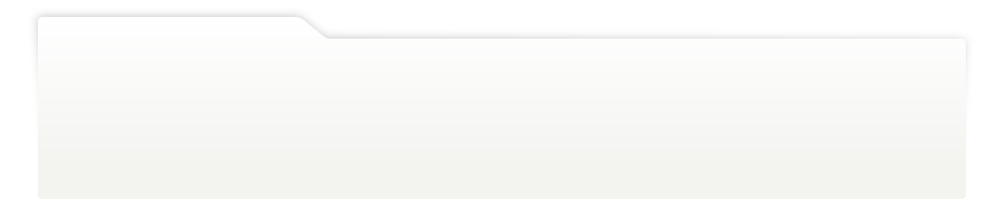
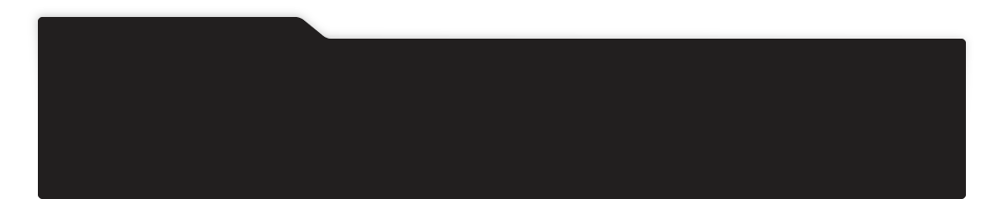
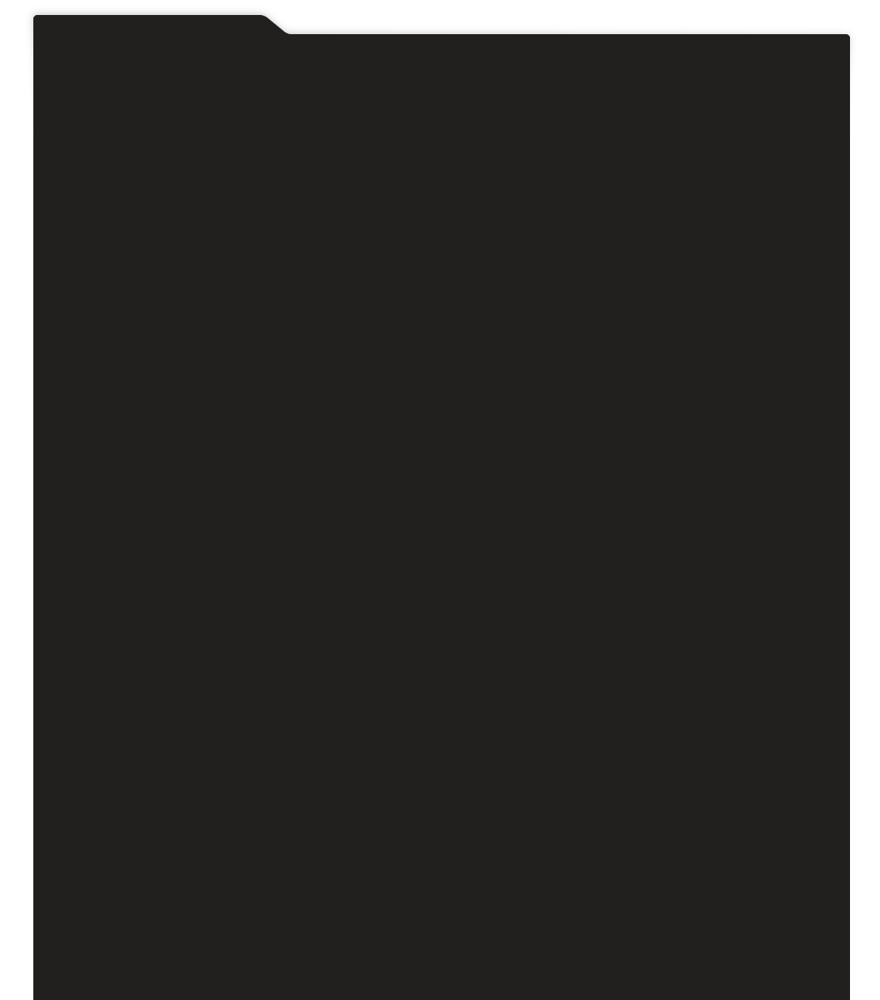
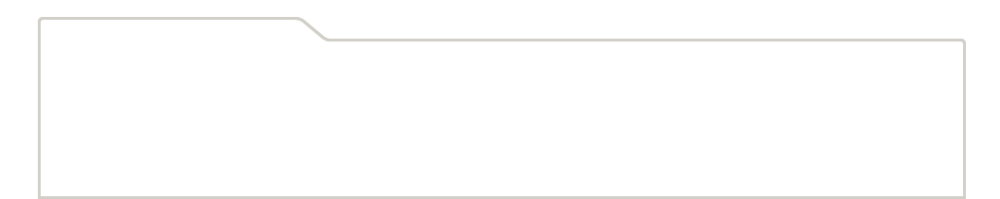
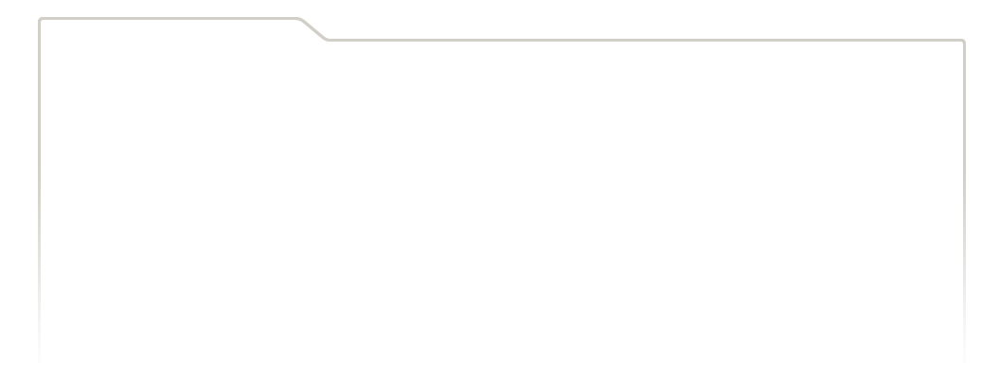
...
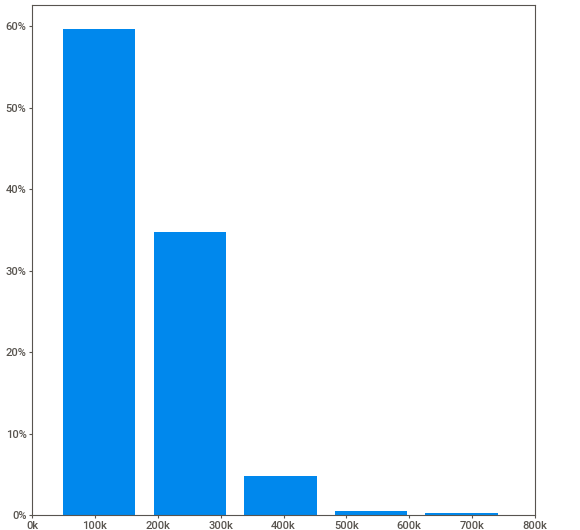
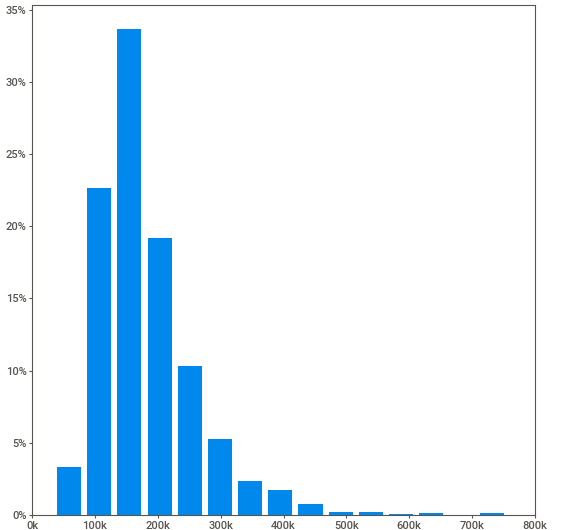
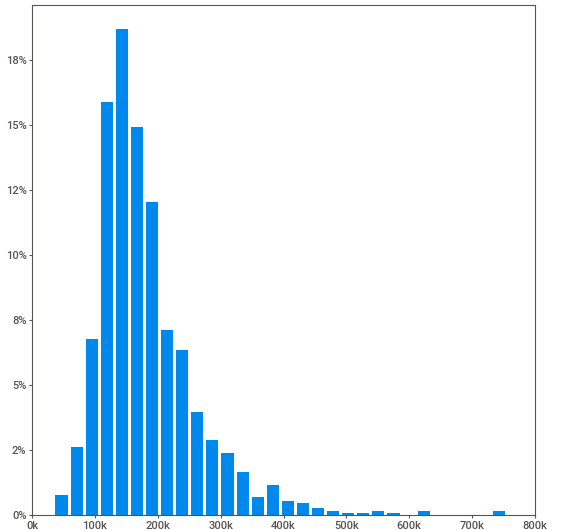
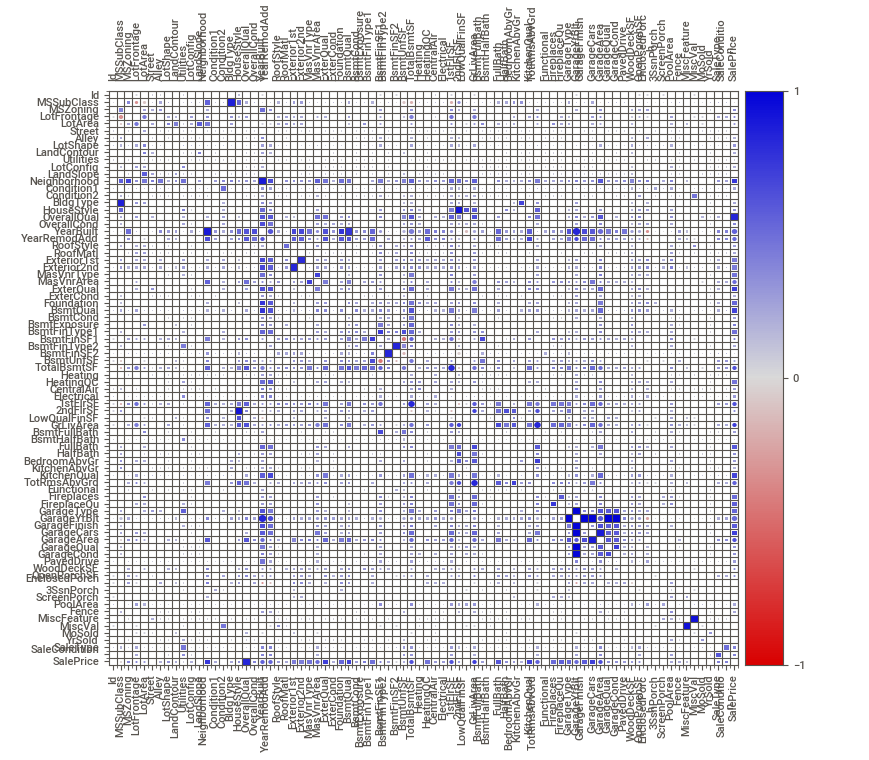
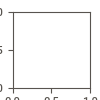

In [7]:
my_report_1 = sweetviz.analyze(train_df)
my_report_1.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)


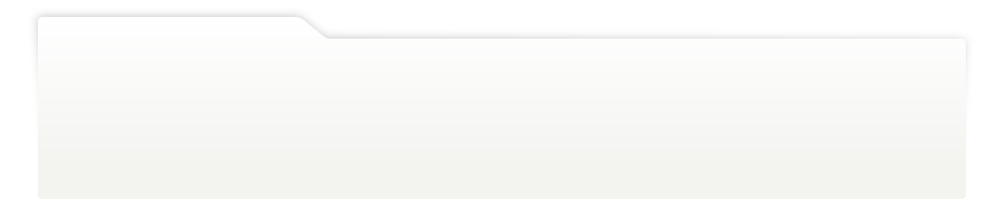
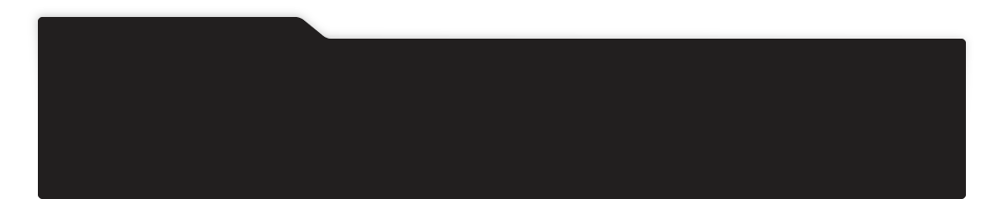
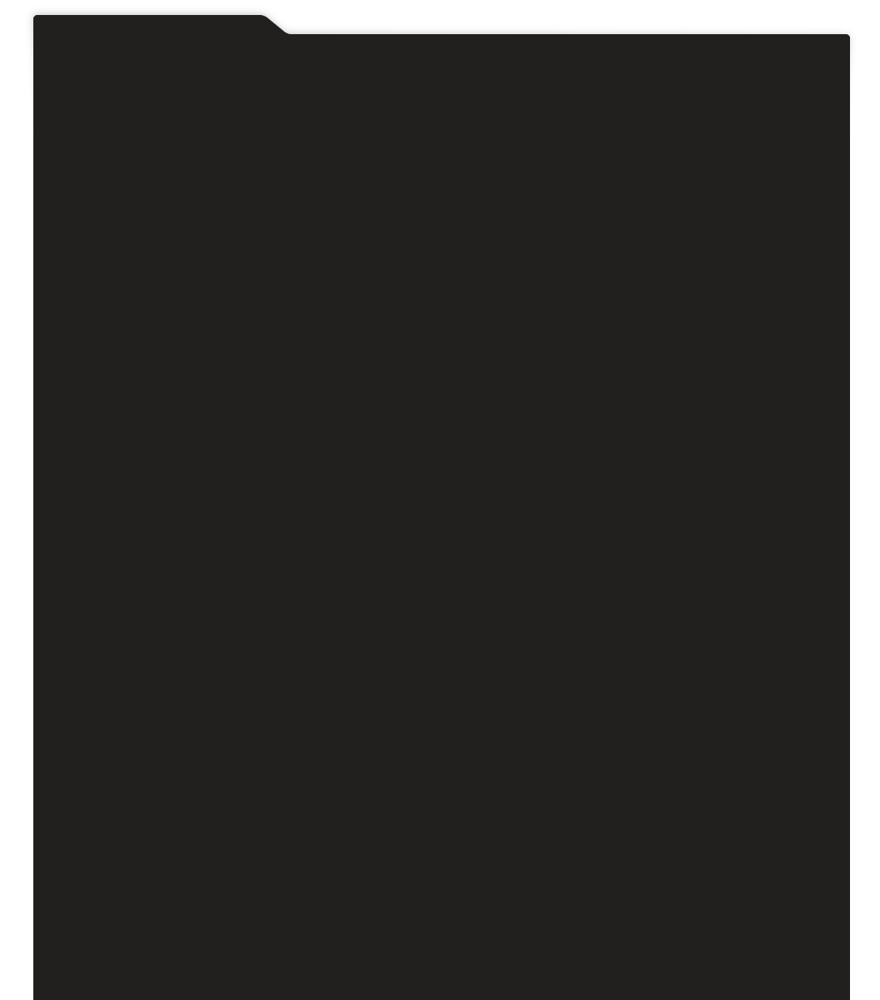
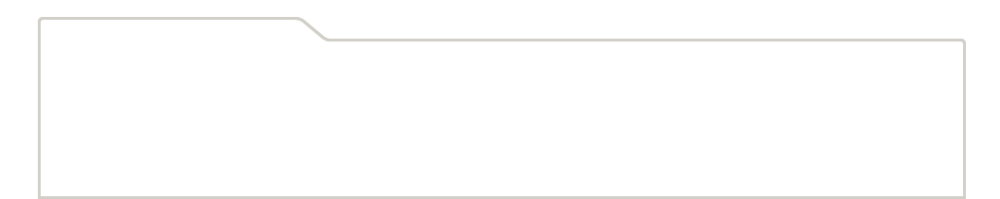
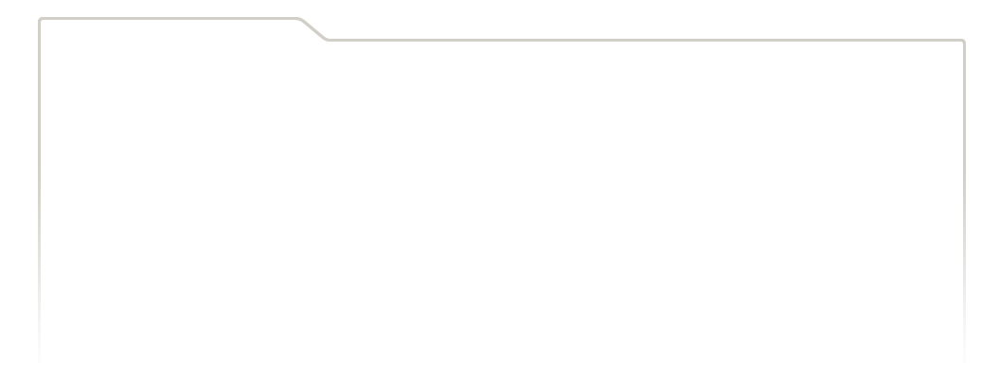
...
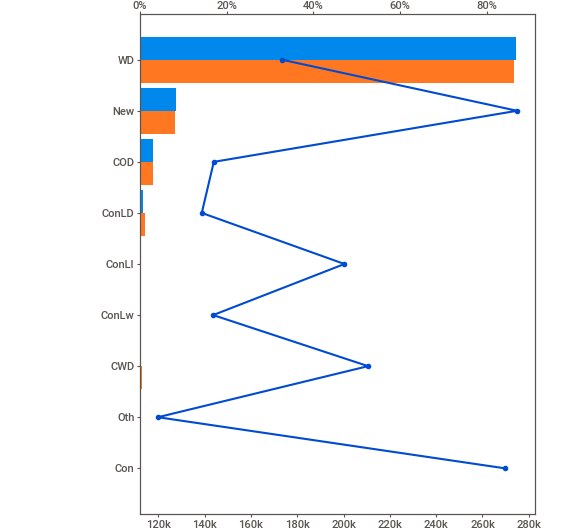
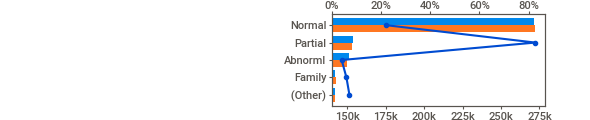
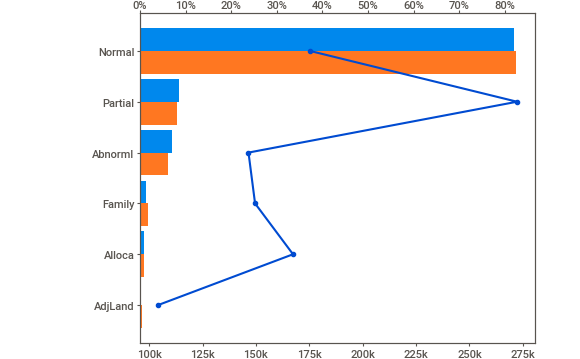
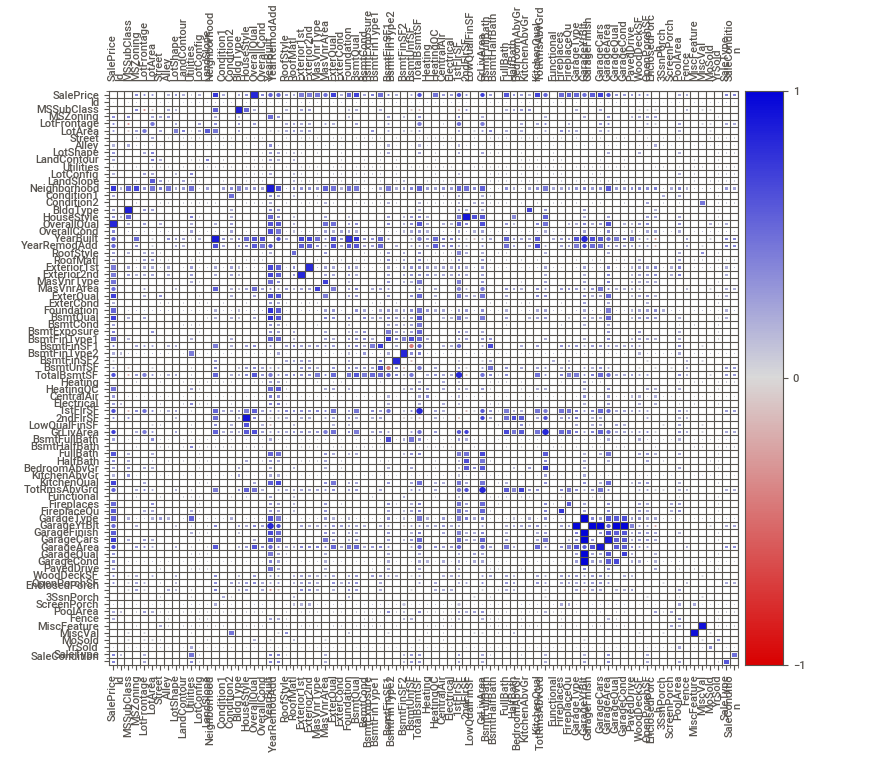
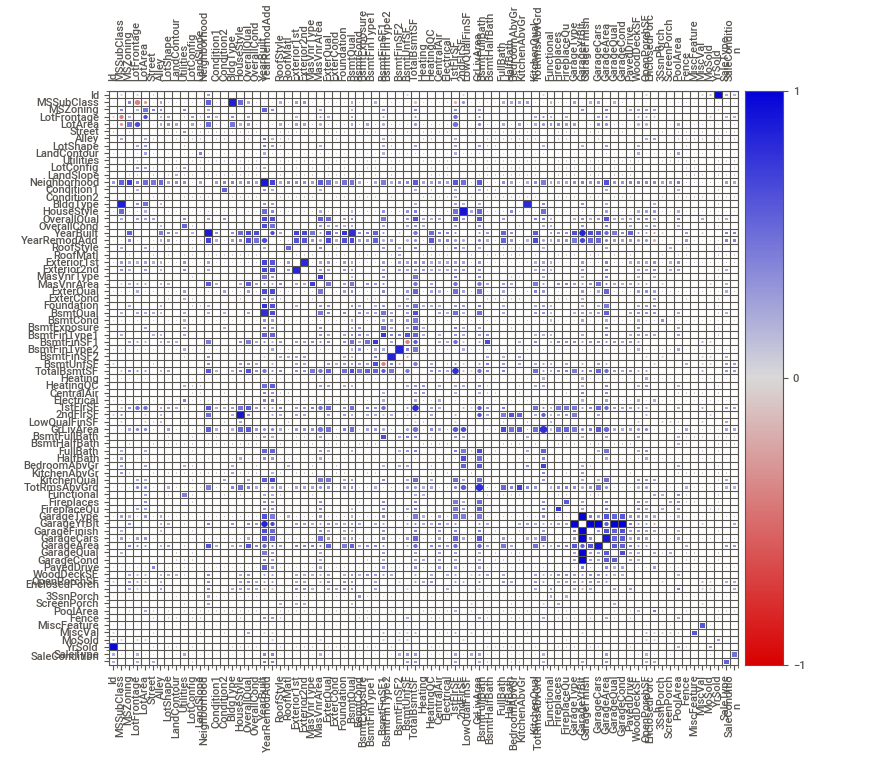

In [8]:
my_report_2 = sweetviz.compare([train_df, "Train"], [test_df, "Test"], "SalePrice")
my_report_2.show_notebook()

<a id ="3.1"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>3.1 Feature Selection</center></h2>

In [9]:
## Drop the columns which contain null values more than 500.
def feature_selection(dataframe):
    df = dataframe.copy()
    for column in df.columns:
        n_null = train_df[column].isnull().sum()
        if n_null > 500:
            df = df.drop([column], axis=1)
    return df

## Feature selection on train data
train = feature_selection(train_df)
print(len(train_df.columns), len(train.columns))

81 76


In [10]:
## Feature selection on test data
feature_list = list(train.columns)
feature_list.remove('SalePrice')
test = test_df[feature_list]

In [11]:
## Select numerical and categorical features
def get_numerical_categorical(df, feature_list, n_unique=False):
    numerical_features = []
    categorical_features = []
    for column in feature_list:
        if n_unique:
            if df[column].nunique() > n_unique:
                numerical_features.append(column)
            else:
                categorical_features.append(column)
        else:
            if df[column].dtypes == 'object': 
                categorical_features.append(column)
            else:
                numerical_features.append(column)
    return numerical_features, categorical_features

target = 'SalePrice'

## Features which has more than 30 unique values as numerical
numerical_features, categorical_features = get_numerical_categorical(train,
                                                                     feature_list,
                                                                     n_unique=30)
numerical_features.remove('Id')
print(len(numerical_features), len(categorical_features))

18 56


In [12]:
## Numerical features' dtype check 
for n in range(len(numerical_features)):
    print(numerical_features[n])
    print(train[numerical_features[n]].dtypes)
    print()

LotFrontage
float64

LotArea
int64

YearBuilt
int64

YearRemodAdd
int64

MasVnrArea
float64

BsmtFinSF1
int64

BsmtFinSF2
int64

BsmtUnfSF
int64

TotalBsmtSF
int64

1stFlrSF
int64

2ndFlrSF
int64

GrLivArea
int64

GarageYrBlt
float64

GarageArea
int64

WoodDeckSF
int64

OpenPorchSF
int64

EnclosedPorch
int64

ScreenPorch
int64



In [13]:
## Categoical features' unique values check
for n in range(len(categorical_features)):
    print(categorical_features[n])
    print(train[categorical_features[n]].unique())
    print()

MSSubClass
[ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]

MSZoning
['RL' 'RM' 'C (all)' 'FV' 'RH']

Street
['Pave' 'Grvl']

LotShape
['Reg' 'IR1' 'IR2' 'IR3']

LandContour
['Lvl' 'Bnk' 'Low' 'HLS']

Utilities
['AllPub' 'NoSeWa']

LotConfig
['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']

LandSlope
['Gtl' 'Mod' 'Sev']

Neighborhood
['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']

Condition1
['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']

Condition2
['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']

BldgType
['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']

HouseStyle
['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']

OverallQual
[ 7  6  8  5  9  4 10  3  1  2]

OverallCond
[5 8 6 7 4 2 3 9 1]

RoofStyle
['Gable' 'Hip' 'Gambrel' 'Mansa

<a id ="3.2"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>3.2 Target Distribution</center></h2>

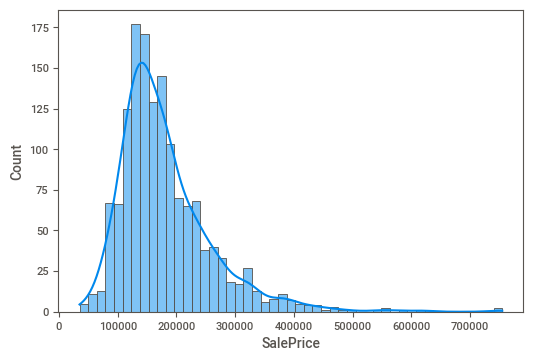

In [14]:
sns.histplot(x=target, data=train, kde=True)
plt.show()

#### [Box-Cox Transformation](https://qiita.com/dyamaguc/items/b468ae66f9ce6ee89724) on 'SalePrice'

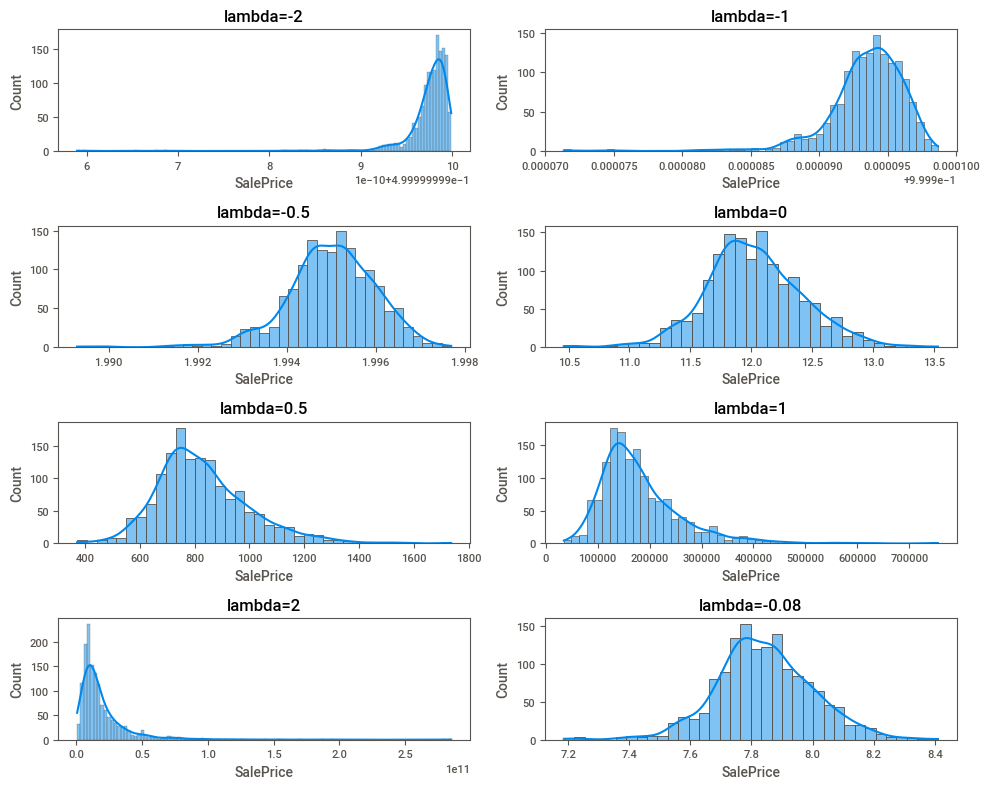

In [15]:
fig = plt.figure(figsize=(10, 8))

list_lambda = [-2, -1, -0.5, 0, 0.5, 1, 2]
for i, lmbda in enumerate(list_lambda):
    boxcox = sp.stats.boxcox(train[target], lmbda=lmbda)
    ax = fig.add_subplot(4, 2, i+1)
    sns.histplot(data=boxcox, kde=True, ax=ax)
    plt.title('lambda='+str(list_lambda[i]))
    plt.xlabel('SalePrice')
    
auto_boxcox, best_lambda = sp.stats.boxcox(train[target], lmbda=None)
ax = fig.add_subplot(4, 2, 8)
sns.histplot(data=auto_boxcox, kde=True, ax=ax)
plt.title('lambda=' + str(round(best_lambda, 2)))
plt.xlabel('SalePrice')
    
fig.tight_layout()

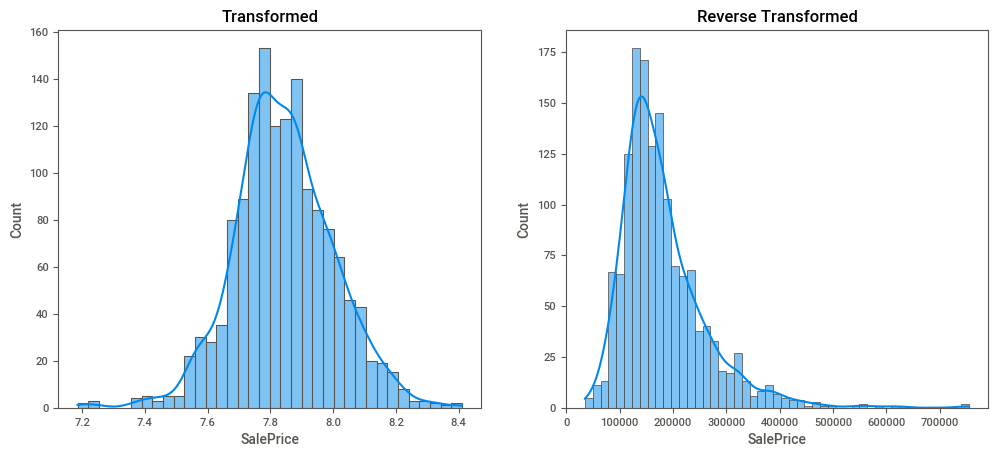

In [16]:
## Box-Cox Summary
fig = plt.figure(figsize=(12, 5))

## Box-Cox Transformation
auto_boxcox, best_lambda = sp.stats.boxcox(train[target], lmbda=None)
ax = fig.add_subplot(1, 2, 1)
sns.histplot(data=auto_boxcox, kde=True, ax=ax)
plt.title('Transformed')
plt.xlabel('SalePrice')

## Reverse Transformation
x = sp.special.inv_boxcox(auto_boxcox, best_lambda)
ax = fig.add_subplot(1, 2, 2)
sns.histplot(x=x, data=train, kde=True, ax=ax)
plt.title('Reverse Transformed')
plt.xlabel('SalePrice')

plt.show()

<a id ="3.3"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>3.3 Numerical Features</center></h2>

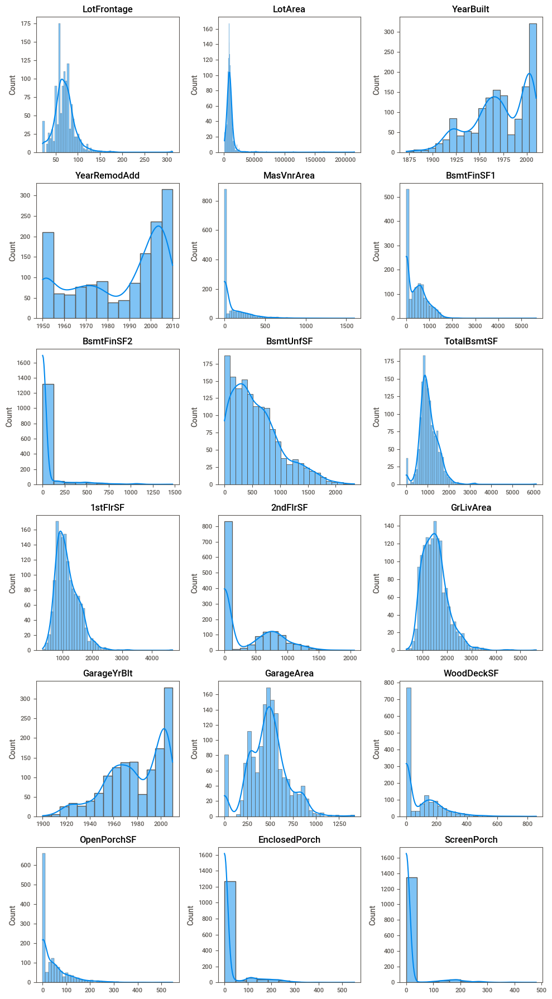

In [17]:
## Distributions of numerical features
fig = plt.figure(figsize=(10, 18))
for i, nf in enumerate(numerical_features):
    ax = fig.add_subplot(6, 3, i+1)
    sns.histplot(train[nf], kde=True, ax=ax)
    plt.title(nf)
    plt.xlabel(None)
fig.tight_layout()

In [18]:
## Heatmap of correlation matrix
numerical_columns = numerical_features + ['SalePrice']
train_numerical = train[numerical_columns]

fig = px.imshow(train_numerical.corr(),
                color_continuous_scale='RdBu_r',
                color_continuous_midpoint=0, 
                aspect='auto')
fig.update_layout(height=600, 
                  width=600,
                  title = "Heatmap",                  
                  showlegend=False)
fig.show()

<a id ="3.4"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>3.4 Categorical Features</center></h2>

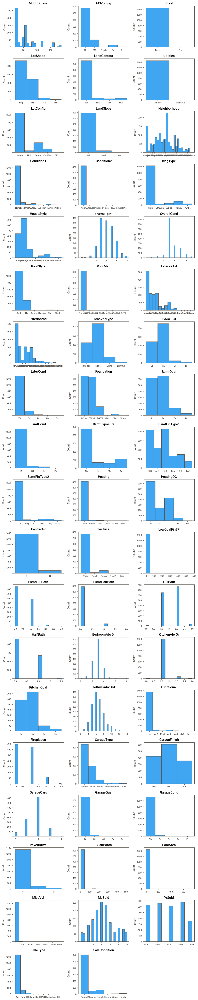

In [19]:
## Distributions of categorical features
fig = plt.figure(figsize=(10, 50))
for i, cf in enumerate(categorical_features):
    ax = fig.add_subplot(19, 3, i+1)
    sns.histplot(train[cf], kde=False, ax=ax)
    plt.title(cf)
    plt.xlabel(None)
fig.tight_layout()

<a id ="4"></a><h1 style="background:#05445E; border:0; border-radius: 12px; color:#D3D3D3"><center>4. PyCaret</center></h1>

#### [PyCaret](https://pycaret.org/) is an open-source, low-code machine learning library in Python that automates machine learning workflows.

In [20]:
## Installing and importing dependencies
!pip install -U -q pycaret --ignore-installed llvmlite
!pip install -U -q numba==0.53 --ignore-installed llvmlite
!pip install -U -q Pillow==9.1.0

from pycaret.regression import *
print('Import done!')

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
tfx-bsl 1.7.0 requires protobuf<4,>=3.13, but you have protobuf 4.21.1 which is incompatible.
tfx-bsl 1.7.0 requires pyarrow<6,>=1, but you have pyarrow 7.0.0 which is incompatible.
tfx-bsl 1.7.0 requires tensorflow!=2.0.*,!=2.1.*,!=2.2.*,!=2.3.*,!=2.4.*,!=2.5.*,!=2.6.*,!=2.7.*,<3,>=1.15.5, but you have tensorflow 2.6.3 which is incompatible.
tensorflow 2.6.3 requires absl-py~=0.10, but you have absl-py 1.0.0 which is incompatible.
tensorflow 2.6.3 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
tensorflow 2.6.3 requires typing-extensions<3.11,>=3.7, but you have typing-extensions 4.2.0 which is incompatible.
tensor

Import done!


<a id ="4.1"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>4.1 Setting up Environment</center></h2>

- The `setup()` function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment.
- When `setup()` is executed, PyCaret will automatically infer the data types for all features, and displays a table containing the features and their inferred data types. If all of the data types are correctly identified `enter` can be pressed to continue or `quit` can be typed to end the expriment. When `silent` parameter equals `True`, you can omit the manual check.
- Also, you can pass directly `numeric_features` or `categorical_features` parameters.

In [21]:
silent = True

exp_reg123 = setup(data=train, 
                   target='SalePrice',
                   train_size=0.8,
                   #numeric_features=numerical_features,
                   numeric_imputation='mean',
                   #categorical_features=categorical_features,
                   categorical_imputation='constant',
                   handle_unknown_categorical=True,
                   ordinal_features=None,
                   date_features=None,
                   ignore_features=['Id'],
                   normalize=True,
                   transformation=False,
                   transform_target=True,
                   transform_target_method='box-cox',
                   combine_rare_levels=True,
                   rare_level_threshold=0.05,
                   remove_multicollinearity=True,
                   multicollinearity_threshold=0.95, 
                   bin_numeric_features=None,
                   log_experiment=False,
                   experiment_name='house_prices_exp1',
                   session_id=123,
                   use_gpu=exp_config['gpu'],
                   silent=silent) 

,Description,Value
0,session_id,123
1,Target,SalePrice
2,Original Data,"(1460, 76)"
3,Missing Values,True
4,Numeric Features,18
5,Categorical Features,56
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1168, 339)"


<a id ="4.2"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>4.2 Create Model</center></h2>

- The `compare_models()` function conducts training and evaluation over 15 models using cross validation.
- The default `fold` parameter value is 10. To seve time, I setted the parameter `fold=5` for saving time.
- By default, `compare_models()` return the best performing model, but can be used to return a list of top N models by using `n_select` parameter.
- `exclude` parameter is used to block certain models.
- To create each models, we can use `create_model()` function.

In [22]:
top3 = compare_models(fold=5,
                      n_select=3,
                      round=2,
                      exclude=['ransac'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,17885.22,873991600.75,29178.67,0.87,0.14,0.10,0.70
catboost,CatBoost Regressor,15535.79,885566401.83,29075.47,0.87,0.13,0.09,4.04
gbr,Gradient Boosting Regressor,17600.74,1000229746.87,30605.10,0.85,0.14,0.10,0.88
rf,Random Forest Regressor,19259.78,1118476946.59,32978.11,0.83,0.15,0.11,2.46
et,Extra Trees Regressor,21530.72,1390140336.88,36900.13,0.78,0.18,0.12,2.84
knn,K Neighbors Regressor,22014.59,1465664448.76,37859.40,0.77,0.18,0.12,0.18
ada,AdaBoost Regressor,25409.48,1582601222.25,39360.41,0.75,0.19,0.14,0.54
dt,Decision Tree Regressor,28780.23,2239156047.41,46703.56,0.65,0.23,0.16,0.06
ridge,Ridge Regression,18984.57,3749482141.18,50145.93,0.35,0.16,0.11,0.15
br,Bayesian Ridge,18279.68,3815543805.32,49808.29,0.34,0.15,0.11,0.39


In [23]:
## Select the best model
best_model = top3[0]

for i in range(len(top3)):
    print(f'Top {i+1} Model: \n{top3[i]}\n\n' )

Top 1 Model: 
PowerTransformedTargetRegressor(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.1, max_depth=-1,
                                min_child_samples=20, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=100, n_jobs=-1,
                                num_leaves=31, objective=None,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                random_state=1...
                                                        importance_type='split',
                                                        learning_rate=0.1,
                                                        max_depth=-1,
                                                        min_child_samples=20,
                                                        m

In [24]:
## Create the specific model.
catboost = create_model('catboost', fold=5, round=2)
et = create_model('et', fold=5, round=2, verbose=False)
rf = create_model('rf', fold=5, round=2, verbose=False)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,15787.07,1023853669.55,31997.71,0.84,0.14,0.09
1,13720.59,546903749.18,23385.97,0.90,0.12,0.08
2,17568.70,1603315161.50,40041.42,0.81,0.14,0.09
3,15099.59,539304524.61,23222.93,0.91,0.13,0.09
4,15502.99,714454904.31,26729.29,0.87,0.13,0.09
Mean,15535.79,885566401.83,29075.47,0.87,0.13,0.09
Std,1239.53,399538602.62,6339.06,0.04,0.01,0.00


In [25]:
models = [catboost, et, rf]

for model in models:
    print(model, '\n')

PowerTransformedTargetRegressor(border_count=254, loss_function='RMSE',
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                random_state=123,
                                regressor=<catboost.core.CatBoostRegressor object at 0x7f43a6fa5dd0>,
                                task_type='CPU', verbose=False) 

PowerTransformedTargetRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                                max_depth=None, max_features='auto',
                                max_leaf_nodes=None, max_samples=None,
                                min_impurity_decrease=0.0,
                                min_impurity_split=None, min_samples_leaf=1,
                                min_samples_split=2,
                                min_weight_fraction_leaf=0.0, n_estimators=100,
                                n_jobs=-1, oob_score=False,
                        

<a id ="4.3"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>4.3 Tune Model</center></h2>

-  The `tune_model()` function automatically tunes the hyperparameters of a model using Random Grid Search on a pre-defined search space.
- We can change the metric for optimization by `optimize` parameter (default, Accuracy).
- `n_iter` is the number of iterations within a random grid search (default value is 10). Increasing the value may improve the performance but will also increase the training time.

In [26]:
## It will take some time.
#tuned_best = tune_model(best_model, fold=5, n_iter=30)

<a id ="4.4"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>4.4 Plot Model</center></h2>

- The `plot_model()` function can be used to analyze the performance across different aspects such as Residuals Plot, Prediction Error, Feature Importance etc. 

In [27]:
plot_model(catboost, plot='parameter')

,Parameters
nan_mode,Min
eval_metric,RMSE
iterations,1000
sampling_frequency,PerTree
leaf_estimation_method,Newton
grow_policy,SymmetricTree
penalties_coefficient,1
boosting_type,Plain
model_shrink_mode,Constant
feature_border_type,GreedyLogSum


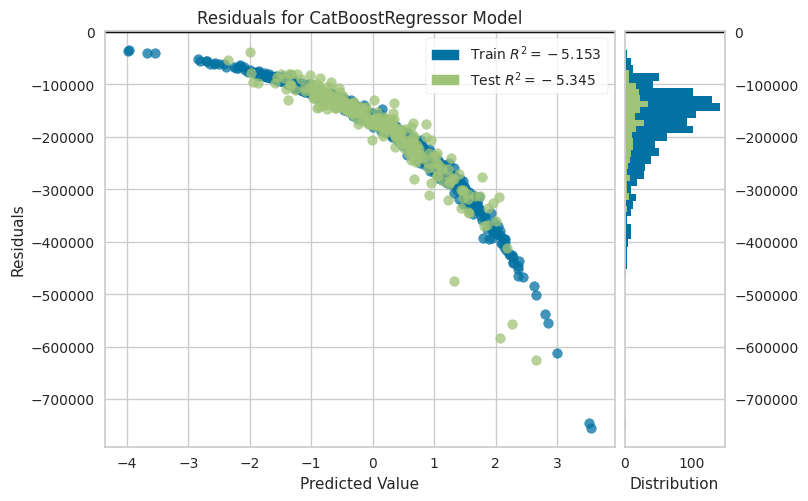

In [28]:
plot_model(catboost, plot='residuals') ## Default

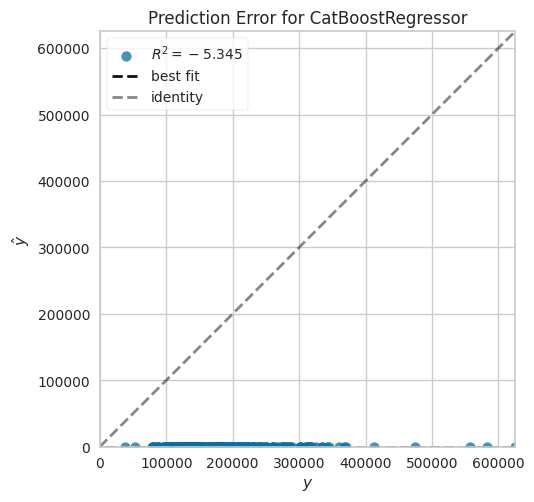

In [29]:
plot_model(catboost, plot = 'error')

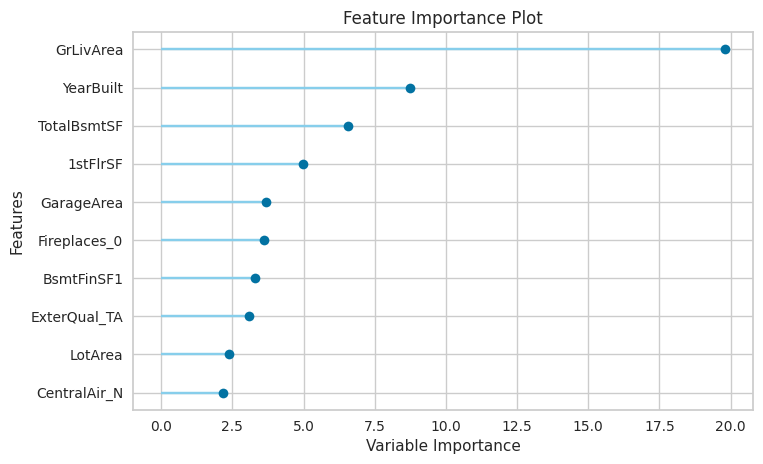

In [30]:
plot_model(catboost, plot='feature')

- We can also use `evaluate_model()` function for further model analysis.

In [31]:
#evaluate_model(catboost)

<a id ="4.5"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>4.5 Validate Model on Hold-out Sample</center></h2>

-  Before finalizing the model, we can conduct the final check by predicting the hold-out set and reviewing the evaluation metrics (All of the evaluation metrics we have seen above are cross-validated results based on training set (80%) only).
- Remaining 20% of data (hold-out samples) is used for `predict_model()` function.

In [32]:
predict_model(catboost)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,14069.7241,660280036.0544,25695.9148,0.8932,0.1124,0.0775


,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SalePrice,Label
0,-1.184345e-07,-0.090142,0.990672,0.778976,0.430645,-0.960208,-0.281457,0.713924,-0.395420,-0.718448,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,222500,219566.096219
1,-4.513665e-01,-0.080044,-2.333395,-1.705206,-0.580321,-0.960208,-0.281457,1.190179,0.075590,-0.185664,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,87000,117503.304409
2,-1.770013e+00,-0.743006,1.089406,0.925104,0.076807,-0.960208,-0.281457,0.921580,-0.190051,-0.486144,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,130000,136035.126985
3,2.550512e-01,-0.064100,0.891937,0.632847,-0.580321,1.134162,-0.281457,-0.981181,0.104609,-0.152839,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,274300,253719.434221
4,-4.513665e-01,0.061329,-0.852375,-1.705206,-0.580321,0.285673,-0.281457,-0.529755,-0.330684,-0.304341,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,140000,140848.997163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,-6.868392e-01,0.025401,-1.576430,0.535429,-0.580321,-0.960208,-0.281457,0.077413,-1.024921,-0.678047,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,165000,171623.369138
288,-1.184345e-07,0.098000,-1.280226,-1.705206,2.115589,-0.322231,3.095379,-1.281380,-0.462388,-0.183139,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,220000,191569.898507
289,-4.513665e-01,-0.243313,-0.720729,1.022523,-0.580321,-0.960208,-0.281457,0.235412,-0.868662,-1.253757,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,122900,126119.208570
290,1.957864e-02,0.133184,-0.062498,-0.779726,0.498043,0.436038,-0.281457,-0.401099,-0.047185,-0.324541,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,135000,190594.950988


<a id ="4.6"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>4.6 Finalize Model and Inference</center></h2>

- `finalize_model()` function fits the model onto the complete dataset including the hold-out sample. 

In [33]:
final_model = finalize_model(catboost)
print(final_model)

PowerTransformedTargetRegressor(border_count=254, loss_function='RMSE',
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                random_state=123,
                                regressor=<catboost.core.CatBoostRegressor object at 0x7f43a6d0dcd0>,
                                task_type='CPU', verbose=False)


In [34]:
## Inference
test_predictions = predict_model(final_model, data=test)
submission_df['SalePrice'] = test_predictions['Label']
submission_df.to_csv('submission_pycaret.csv', index=False)
test_predictions

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Label
0,1461,20,RH,80.0,11622,Pave,Reg,Lvl,AllPub,Inside,...,0,0,120,0,0,6,2010,WD,Normal,147963.773403
1,1462,20,RL,81.0,14267,Pave,IR1,Lvl,AllPub,Corner,...,0,0,0,0,12500,6,2010,WD,Normal,182927.772012
2,1463,60,RL,74.0,13830,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,3,2010,WD,Normal,222243.777606
3,1464,60,RL,78.0,9978,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,6,2010,WD,Normal,227826.113091
4,1465,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,Inside,...,0,0,144,0,0,1,2010,WD,Normal,210174.750600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,6,2006,WD,Normal,93407.390401
1455,2916,160,RM,21.0,1894,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,4,2006,WD,Abnorml,93562.860039
1456,2917,20,RL,160.0,20000,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,9,2006,WD,Abnorml,176648.150320
1457,2918,85,RL,62.0,10441,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,700,7,2006,WD,Normal,130840.833004


<a id ="4.7"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>4.7 Ensemble Models</center></h2>

- `blend_model()` function creates multiple models and then averages the individual predictions to form a final prediction. 

In [35]:
## Blend individual models
blender = blend_models(estimator_list=models, fold=5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,17404.9252,1177160312.7045,34309.7699,0.8108,0.1527,0.1001
1,15693.5018,644483374.8341,25386.6771,0.8847,0.1260,0.0894
2,19933.9392,1726423456.9575,41550.2522,0.7930,0.1594,0.1084
3,17434.4653,769398553.4473,27738.0344,0.8697,0.1501,0.1045
4,17083.2870,778376992.8106,27899.4085,0.8603,0.1329,0.0946
Mean,17510.0237,1019168538.1508,31376.8284,0.8437,0.1442,0.0994
Std,1369.2317,396465763.0057,5887.5442,0.0355,0.0126,0.0068


In [36]:
## Validate blended model
predict_model(blender)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,15392.2398,781090092.2008,27947.9891,0.8736,0.1239,0.0845


,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SalePrice,Label
0,-1.184345e-07,-0.090142,0.990672,0.778976,0.430645,-0.960208,-0.281457,0.713924,-0.395420,-0.718448,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,222500,219988.650165
1,-4.513665e-01,-0.080044,-2.333395,-1.705206,-0.580321,-0.960208,-0.281457,1.190179,0.075590,-0.185664,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,87000,120886.767865
2,-1.770013e+00,-0.743006,1.089406,0.925104,0.076807,-0.960208,-0.281457,0.921580,-0.190051,-0.486144,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,130000,139558.296309
3,2.550512e-01,-0.064100,0.891937,0.632847,-0.580321,1.134162,-0.281457,-0.981181,0.104609,-0.152839,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,274300,234123.647647
4,-4.513665e-01,0.061329,-0.852375,-1.705206,-0.580321,0.285673,-0.281457,-0.529755,-0.330684,-0.304341,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,140000,144392.104009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,-6.868392e-01,0.025401,-1.576430,0.535429,-0.580321,-0.960208,-0.281457,0.077413,-1.024921,-0.678047,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,165000,153251.994232
288,-1.184345e-07,0.098000,-1.280226,-1.705206,2.115589,-0.322231,3.095379,-1.281380,-0.462388,-0.183139,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,220000,179001.564522
289,-4.513665e-01,-0.243313,-0.720729,1.022523,-0.580321,-0.960208,-0.281457,0.235412,-0.868662,-1.253757,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,122900,126084.899300
290,1.957864e-02,0.133184,-0.062498,-0.779726,0.498043,0.436038,-0.281457,-0.401099,-0.047185,-0.324541,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,135000,194024.304144


In [37]:
## Finalize blended model
final_blender = finalize_model(blender)
print(final_blender)

PowerTransformedTargetRegressor(estimators=[('catboost',
                                             <catboost.core.CatBoostRegressor object at 0x7f43a7e50e10>),
                                            ('et',
                                             ExtraTreesRegressor(bootstrap=False,
                                                                 ccp_alpha=0.0,
                                                                 criterion='mse',
                                                                 max_depth=None,
                                                                 max_features='auto',
                                                                 max_leaf_nodes=None,
                                                                 max_samples=None,
                                                                 min_impurity_decrease=0.0,
                                                                 min_impurity_split=None,
                        

In [38]:
## Inference with blended model
test_blend_predictions = predict_model(final_blender, data=test)
submission_df['SalePrice'] = test_blend_predictions['Label']
submission_df.to_csv('submission_blender.csv', index=False)
test_blend_predictions

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Label
0,1461,20,RH,80.0,11622,Pave,Reg,Lvl,AllPub,Inside,...,0,0,120,0,0,6,2010,WD,Normal,135331.231515
1,1462,20,RL,81.0,14267,Pave,IR1,Lvl,AllPub,Corner,...,0,0,0,0,12500,6,2010,WD,Normal,159620.672176
2,1463,60,RL,74.0,13830,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,3,2010,WD,Normal,193580.605629
3,1464,60,RL,78.0,9978,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,6,2010,WD,Normal,198021.598476
4,1465,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,Inside,...,0,0,144,0,0,1,2010,WD,Normal,197521.802427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,6,2006,WD,Normal,86457.549554
1455,2916,160,RM,21.0,1894,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,4,2006,WD,Abnorml,87104.072164
1456,2917,20,RL,160.0,20000,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,9,2006,WD,Abnorml,157110.941687
1457,2918,85,RL,62.0,10441,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,700,7,2006,WD,Normal,124552.191808


<a id ="5"></a><h1 style="background:#05445E; border:0; border-radius: 12px; color:#D3D3D3"><center>5. Deep Learning</center></h1>

In [39]:
## Import dependencies 
import sklearn
from sklearn.model_selection import KFold

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

<a id ="5.1"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>5.1 Creating Dataset</center></h2>

In [40]:
## Fill NaN in numerical columns with its median
train[numerical_features] = train[numerical_features].fillna(train[numerical_features].median()) 

## Fill NaN in categorical columns with its mode
train[categorical_features] = train[categorical_features].fillna(train[categorical_features].mode().iloc[0])  

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [41]:
## Box-Cox Transformation on target ('SalePrice')
auto_boxcox, best_lambda = sp.stats.boxcox(train[target], lmbda=None)
train['target_transformed'] = auto_boxcox

## Reverse Transformation
#x = sp.special.inv_boxcox(auto_boxcox, best_lambda)

## Box-Cox + Standardization
box_cox_mean = train['target_transformed'].mean()
box_cox_std = train['target_transformed'].std()
train['target_transformed_standardized'] = (train['target_transformed'] - box_cox_mean) / box_cox_std

In [42]:
## Train validation split
n_splits = exp_config['n_splits']
kf = KFold(n_splits=n_splits)
train['k_folds'] = -1
for fold, (train_idx, valid_idx) in enumerate(kf.split(train)):
    train['k_folds'][valid_idx] = fold
    
for i in range(n_splits):
    print(f"fold {i}: {len(train.query('k_folds==@i'))} samples")

fold 0: 292 samples
fold 1: 292 samples
fold 2: 292 samples
fold 3: 292 samples
fold 4: 292 samples


In [43]:
## Hold-out validation
valid_fold = train.query(f'k_folds == 0').reset_index(drop=True)
train_fold = train.query(f'k_folds != 0').reset_index(drop=True)
print(len(train_fold), len(valid_fold))

1168 292


In [44]:
def df_to_dataset(dataframe, target=None,
                  shuffle=False, repeat=False,
                  batch_size=5, drop_remainder=False):
    df = dataframe.copy()
    if target is not None:
        labels = df.pop(target)
        data = {key: value[:, tf.newaxis] for key, value in df.items()}
        data = dict(data)
        ds = tf.data.Dataset.from_tensor_slices((data, labels))
    else:
        data = {key: value[:, tf.newaxis] for key, value in df.items()}
        data = dict(data)
        ds = tf.data.Dataset.from_tensor_slices(data)
    
    if shuffle:
        ds = ds.shuffle(buffer_size=len(df))
    if repeat:
        ds = ds.repeat()
    ds = ds.batch(batch_size, drop_remainder=drop_remainder)
    ds = ds.prefetch(batch_size)
    return ds

In [45]:
## Create datasets
batch_size = exp_config['batch_size']
target = 'target_transformed_standardized'

train_ds = df_to_dataset(train_fold, 
                         target=target,
                         shuffle=True,
                         repeat=False,
                         batch_size=batch_size,
                         drop_remainder=True)

valid_ds = df_to_dataset(valid_fold,
                         target=target,
                         shuffle=False,
                         repeat=False,
                         batch_size=batch_size,
                         drop_remainder=False)

example = next(iter(train_ds))[0]
input_dtypes = {}
for key in example:
    input_dtypes[key] = example[key].dtype
    print(f'{key}, shape:{example[key].shape}, {example[key].dtype}')

Id, shape:(128, 1), <dtype: 'int64'>
MSSubClass, shape:(128, 1), <dtype: 'int64'>
MSZoning, shape:(128, 1), <dtype: 'string'>
LotFrontage, shape:(128, 1), <dtype: 'float64'>
LotArea, shape:(128, 1), <dtype: 'int64'>
Street, shape:(128, 1), <dtype: 'string'>
LotShape, shape:(128, 1), <dtype: 'string'>
LandContour, shape:(128, 1), <dtype: 'string'>
Utilities, shape:(128, 1), <dtype: 'string'>
LotConfig, shape:(128, 1), <dtype: 'string'>
LandSlope, shape:(128, 1), <dtype: 'string'>
Neighborhood, shape:(128, 1), <dtype: 'string'>
Condition1, shape:(128, 1), <dtype: 'string'>
Condition2, shape:(128, 1), <dtype: 'string'>
BldgType, shape:(128, 1), <dtype: 'string'>
HouseStyle, shape:(128, 1), <dtype: 'string'>
OverallQual, shape:(128, 1), <dtype: 'int64'>
OverallCond, shape:(128, 1), <dtype: 'int64'>
YearBuilt, shape:(128, 1), <dtype: 'int64'>
YearRemodAdd, shape:(128, 1), <dtype: 'int64'>
RoofStyle, shape:(128, 1), <dtype: 'string'>
RoofMatl, shape:(128, 1), <dtype: 'string'>
Exterior1st, s

2022-06-11 01:57:53.328554: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


<a id ="5.2"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>5.2 Preprocessing Model</center></h2>

In [46]:
def create_preprocessing_model(numerical, categorical, input_dtypes, df):
    ## Create input layers
    preprocess_inputs = {}
    for key in numerical:
        preprocess_inputs[key] = layers.Input(shape=(1,),
                                              dtype=input_dtypes[key])
    for key in categorical:
        preprocess_inputs[key] = layers.Input(shape=(1,),
                                              dtype=input_dtypes[key])
    
    ## Create preprocess layers
    normalize_layers = {}
    for key in numerical:
        normalize_layer = layers.Normalization(mean=df[key].mean(),
                                               variance=df[key].var())
        normalize_layers[key] = normalize_layer
        
    lookup_layers = {}
    for key in categorical:
        if input_dtypes[key] == tf.string:
            lookup_layer = layers.StringLookup(vocabulary=df[key].unique(),
                                               output_mode='int')
        elif input_dtypes[key] == tf.int64:
            lookup_layer = layers.IntegerLookup(vocabulary=df[key].unique(),
                                                output_mode='int')
        lookup_layers[key] = lookup_layer
        
    ## Create outputs
    preprocess_outputs = {}
    for key in preprocess_inputs:
        if key in normalize_layers:
            output = normalize_layers[key](preprocess_inputs[key])
            preprocess_outputs[key] = output
        elif key in lookup_layers:
            output = lookup_layers[key](preprocess_inputs[key])
            preprocess_outputs[key] = output
            
    ## Create model
    preprocessing_model = tf.keras.Model(preprocess_inputs,
                                         preprocess_outputs)
    
    return preprocessing_model, lookup_layers

In [47]:
## Create preprocessing model
preprocessing_model, lookup_layers = create_preprocessing_model(
    numerical_features, categorical_features, 
    input_dtypes, train_fold)

## Apply the preprocessing model in tf.data.Dataset.map
train_ds = train_ds.map(lambda x, y: (preprocessing_model(x), y),
                        num_parallel_calls=tf.data.AUTOTUNE)
valid_ds = valid_ds.map(lambda x, y: (preprocessing_model(x), y),
                        num_parallel_calls=tf.data.AUTOTUNE)

## Display a preprocessed input sample
example = next(train_ds.take(1).as_numpy_iterator())[0]
for key in example:
    print(f'{key}, shape: {example[key].shape}, {example[key].dtype}')

2022-06-11 01:57:58.199581: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


LotFrontage, shape: (128, 1), float32
LotArea, shape: (128, 1), float32
YearBuilt, shape: (128, 1), float32
YearRemodAdd, shape: (128, 1), float32
MasVnrArea, shape: (128, 1), float32
BsmtFinSF1, shape: (128, 1), float32
BsmtFinSF2, shape: (128, 1), float32
BsmtUnfSF, shape: (128, 1), float32
TotalBsmtSF, shape: (128, 1), float32
1stFlrSF, shape: (128, 1), float32
2ndFlrSF, shape: (128, 1), float32
GrLivArea, shape: (128, 1), float32
GarageYrBlt, shape: (128, 1), float32
GarageArea, shape: (128, 1), float32
WoodDeckSF, shape: (128, 1), float32
OpenPorchSF, shape: (128, 1), float32
EnclosedPorch, shape: (128, 1), float32
ScreenPorch, shape: (128, 1), float32
MSSubClass, shape: (128, 1), int64
MSZoning, shape: (128, 1), int64
Street, shape: (128, 1), int64
LotShape, shape: (128, 1), int64
LandContour, shape: (128, 1), int64
Utilities, shape: (128, 1), int64
LotConfig, shape: (128, 1), int64
LandSlope, shape: (128, 1), int64
Neighborhood, shape: (128, 1), int64
Condition1, shape: (128, 1)

<a id ="5.3"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>5.3 Training Model</center></h2>

In [48]:
def create_training_model(numerical, categorical, input_dtypes, df,
                          lookup_layers, emb_dim=1,
                          model_units=[128,], 
                          dropout_rates=[0.2,]):
    ## Create input layers
    model_inputs = {}
    for key in numerical:
        model_inputs[key] = layers.Input(shape=(1,), 
                                         dtype='float32')
    for key in categorical:
        model_inputs[key] = layers.Input(shape=(1,), 
                                         dtype='int64')
    
    features = []
    
    for key in model_inputs:
        if key in numerical:
            features.append(model_inputs[key])
        elif key in categorical:
            ## Create embedding layers
            embedding = layers.Embedding(
                input_dim=lookup_layers[key].vocabulary_size(),
                output_dim=emb_dim)
            encoded_categorical = embedding(model_inputs[key])
            encoded_categorical = tf.squeeze(encoded_categorical, axis=1)
            features.append(encoded_categorical)
        
    ## Concatenate all features
    x = tf.concat(features, axis=1)
    
    for units, dropout_rate in zip(model_units, dropout_rates):
        feedforward = keras.Sequential([
            layers.Dense(units, use_bias=False),
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Dropout(dropout_rate),
        ])
        x = feedforward(x)
        
    final_layer = layers.Dense(units=1, activation=None)
    model_outputs = final_layer(x)
    
    training_model = tf.keras.Model(inputs=model_inputs,
                                    outputs=model_outputs)
    return training_model

In [49]:
## Create training model
emb_dim = model_config['emb_dim']
model_units = model_config['model_units']
dropout_rates = model_config['dropout_rates']

training_model = create_training_model(numerical_features,
                                       categorical_features,
                                       input_dtypes,
                                       train_fold,
                                       lookup_layers,
                                       emb_dim=emb_dim,
                                       model_units=model_units, 
                                       dropout_rates=dropout_rates)

## Model compile and build
lr = exp_config['learning_rate']
optimizer = keras.optimizers.Adam(learning_rate=lr)
loss_fn = keras.losses.MeanSquaredError()

training_model.compile(optimizer=optimizer,
                       loss=loss_fn,
                       metrics=[keras.metrics.mean_squared_error,])

training_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_93 (InputLayer)           [(None, 1)]          0                                            
__________________________________________________________________________________________________
input_94 (InputLayer)           [(None, 1)]          0                                            
__________________________________________________________________________________________________
input_95 (InputLayer)           [(None, 1)]          0                                            
__________________________________________________________________________________________________
input_96 (InputLayer)           [(None, 1)]          0                                            
____________________________________________________________________________________________

<a id ="5.4"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>5.4 Model Training</center></h2>

In [50]:
## Settings for Training
epochs = exp_config['train_epochs']
batch_size = exp_config['batch_size']
steps_per_epoch = len(train_fold)//batch_size 

## For saving the best model
checkpoint_filepath = exp_config['checkpoint_filepath']
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, 
    save_weights_only=True, 
    monitor='val_loss', 
    mode='min', 
    save_best_only=True)

## For the adjustment of learning rate
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    cooldown=10,
    min_lr=1e-5,
    verbose=1)

## Model training
history = training_model.fit(train_ds,
                             epochs=epochs,
                             shuffle=True,
                             validation_data=valid_ds,
                             callbacks=[model_checkpoint_callback,
                                        reduce_lr])

## Load the best parameters
training_model.load_weights(checkpoint_filepath)

Epoch 1/100
9/9 [==============================] - 10s 293ms/step - loss: 1.1137 - mean_squared_error: 1.1137 - val_loss: 0.6669 - val_mean_squared_error: 0.6669
Epoch 2/100
9/9 [==============================] - 2s 226ms/step - loss: 0.7080 - mean_squared_error: 0.7080 - val_loss: 0.4769 - val_mean_squared_error: 0.4769
Epoch 3/100
9/9 [==============================] - 2s 225ms/step - loss: 0.5640 - mean_squared_error: 0.5640 - val_loss: 0.5238 - val_mean_squared_error: 0.5238
Epoch 4/100
9/9 [==============================] - 2s 228ms/step - loss: 0.4343 - mean_squared_error: 0.4343 - val_loss: 0.4452 - val_mean_squared_error: 0.4452
Epoch 5/100
9/9 [==============================] - 2s 224ms/step - loss: 0.3850 - mean_squared_error: 0.3850 - val_loss: 0.4659 - val_mean_squared_error: 0.4659
Epoch 6/100
9/9 [==============================] - 2s 233ms/step - loss: 0.3571 - mean_squared_error: 0.3571 - val_loss: 0.4485 - val_mean_squared_error: 0.4485
Epoch 7/100
9/9 [================

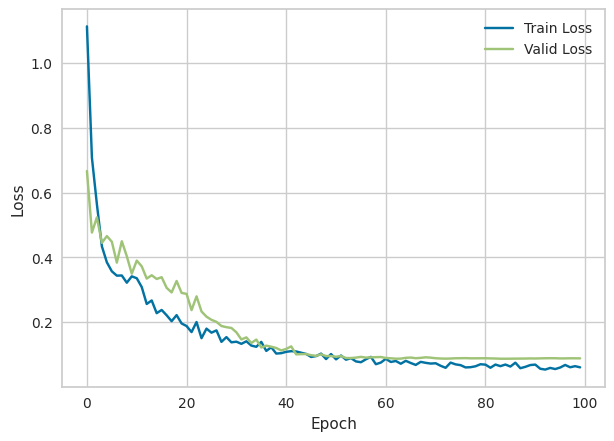

In [51]:
## Plot the train and valid losses
def plot_history(hist, title=None, valid=True):
    plt.figure(figsize=(7, 5))
    plt.plot(np.array(hist.index), hist['loss'], label='Train Loss')
    if valid:
        plt.plot(np.array(hist.index), hist['val_loss'], label='Valid Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(title)
    plt.show()
    
hist = pd.DataFrame(history.history)
plot_history(hist)

<a id ="5.5"></a><h2 style="background:#75E6DA; border:0; border-radius: 12px; color:black"><center>5.5 Inference</center></h2>

In [52]:
## Inference_model = preprocessing_model + training_model
inference_inputs = preprocessing_model.input
inference_outputs = training_model(preprocessing_model(inference_inputs))
inference_model = tf.keras.Model(inputs=inference_inputs,
                                 outputs=inference_outputs)

In [53]:
## Fill NaN in numerical columns with its median
test[numerical_features] = test[numerical_features].fillna(train[numerical_features].median()) 
## Fill NaN in categorical columns with its mode
test[categorical_features] = test[categorical_features].fillna(train[categorical_features].mode().iloc[0])  

## Create test dataset
test_ds = df_to_dataset(test,
                        target=None,
                        shuffle=False,
                        repeat=False,
                        batch_size=batch_size,
                        drop_remainder=False,)

In [54]:
preds = inference_model.predict(test_ds)
preds = np.squeeze(preds)

def reverse_transformation(preds,
                           mean=box_cox_mean,
                           std=box_cox_std,
                           box_cox_lambda=best_lambda):
    x = (preds * std) + mean
    x = sp.special.inv_boxcox(x, box_cox_lambda)
    return x 

price_inference = reverse_transformation(preds)
submission_df['SalePrice'] = price_inference
submission_df.to_csv('submission_dnn.csv', index=False)
submission_df.head()

,Id,SalePrice
0,1461,132615.453125
1,1462,156092.093750
2,1463,194207.734375
3,1464,195063.437500
4,1465,194540.718750
